#Libraries Used

In [ ]:
""" after running, a rest is needed"""
!pip install dython

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import seaborn as sns
from plotly.subplots import make_subplots
from google.colab import files
from google.colab import drive
from sklearn.utils import resample
from imblearn import under_sampling
from imblearn import over_sampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from dython.nominal import associations
from scipy.stats import norm
import math
import matplotlib.pyplot as plt
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
from dataclasses import dataclass
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import KFold

#Data Exploration and Analysis

##Importing Raw Data From Drive

In [ ]:
#drive.mount('drive', force_remount=True)
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/bank-full.csv", sep=";")
#df = pd.read_csv("/content/bank-full.csv", sep=";")
df.head()


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


##Data Formatting and Wrangling

###Changing y values to 1's and 0's from yes and  no

In [ ]:
yplt = df['y']
df['y']=df['y'].map({'yes':1,'no':0})
df['pdays']=df['pdays'].replace(-1,0)
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,0,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,0,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,0,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,0,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,0,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,0,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,0,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,0,0,unknown,0


###Checking for null values

In [ ]:
print(df.isnull().sum())
print('\nThe dataset shape is', df.shape)

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

The dataset shape is (45211, 17)


In [ ]:
df.describe()


,age,balance,day,duration,campaign,pdays,previous,y
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,41.015195,0.580323,0.116985
std,10.618762,3044.765829,8.322476,257.527812,3.098021,99.792615,2.303441,0.321406
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,0.000000,0.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,0.000000,0.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,0.000000,0.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000,1.000000


###Heatmap

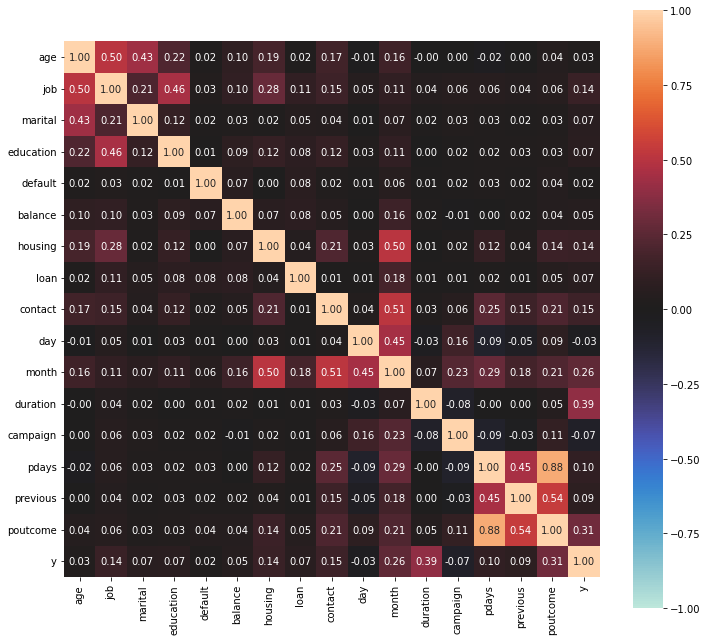

In [ ]:
correlation= associations(df, filename= 'df_correlation.png', figsize=(12,11))

### Histograms of all variables

In [ ]:
fig = make_subplots(rows=2, cols=2,
                   subplot_titles=["Target (Y)","Housing","Default", "Loan"], shared_xaxes=True, vertical_spacing=0.15)
fig.add_trace(go.Histogram(x=yplt, name='Target', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"), row=1, col=1)
fig.add_trace(go.Histogram(x=df.housing, name='Housing', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"),row=1, col=2)
fig.add_trace(go.Histogram(x=df.default, name='Default', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"),row=2, col=1)
fig.add_trace(go.Histogram(x=df.loan, name='Loan', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"), row=2, col=2)
fig.update_layout(height=450, width=700, title='Boolean Variables', title_x=0.5, showlegend= False)

In [ ]:
fig2 = make_subplots(rows=2, cols=2,
                   subplot_titles=["Education", "Marital", "Contact", "pOutcome"])
fig2.add_trace(go.Histogram(x=df.education, name='Education', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"),row=1, col=1)
fig2.add_trace(go.Histogram(x=df.marital, name='Marital', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"),row=1, col=2)
fig2.add_trace(go.Histogram(x=df.contact, name='Contact', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"), row=2, col=1)
fig2.add_trace(go.Histogram(x=df.poutcome, name='pOutcome', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"), row=2, col=2)
fig2.update_layout(height=450, width=1000, title='Categorical Variables', title_x=0.5, showlegend= False)

In [ ]:
fig2 = make_subplots(rows=2, cols=1,
                   subplot_titles=["Job", "Month"])
fig2.add_trace(go.Histogram(x=df.job, name='Job', texttemplate= "%{y}", marker_color = "rgb(62,130,171)" ), row=1, col=1)
fig2.add_trace(go.Histogram(x=df.month, name='Month', texttemplate= "%{y}", marker_color = "rgb(62,130,171)"),row=2, col=1)
fig2.update_layout(height=750, width=900, title='Categorical Variables', title_x=0.5, showlegend= False)

In [ ]:
fig3 = make_subplots(rows=2, cols=3,
                   subplot_titles=["Age", "Campaign", "Previous", "Duration", "pDays"])
fig3.add_trace(go.Histogram(x=df.age, name='Age', marker_color = "rgb(62,130,171)"),row=1, col=1)
fig3.add_trace(go.Histogram(x=df.duration, name='Duration', marker_color = "rgb(62,130,171)"),row=2, col=1)
fig3.add_trace(go.Histogram(x=df.campaign, name='Campaign', marker_color = "rgb(62,130,171)"), row=1, col=2)
fig3.add_trace(go.Histogram(x=df.pdays, name='pDays', marker_color = "rgb(62,130,171)"), row=2, col=2)
fig3.add_trace(go.Histogram(x=df.previous, name='Previous', marker_color = "rgb(62,130,171)"),row=1, col=3)
fig3.update_layout(height=750, width=1000, title='Histograms of Categorical Variables', title_x=0.5, showlegend = False)

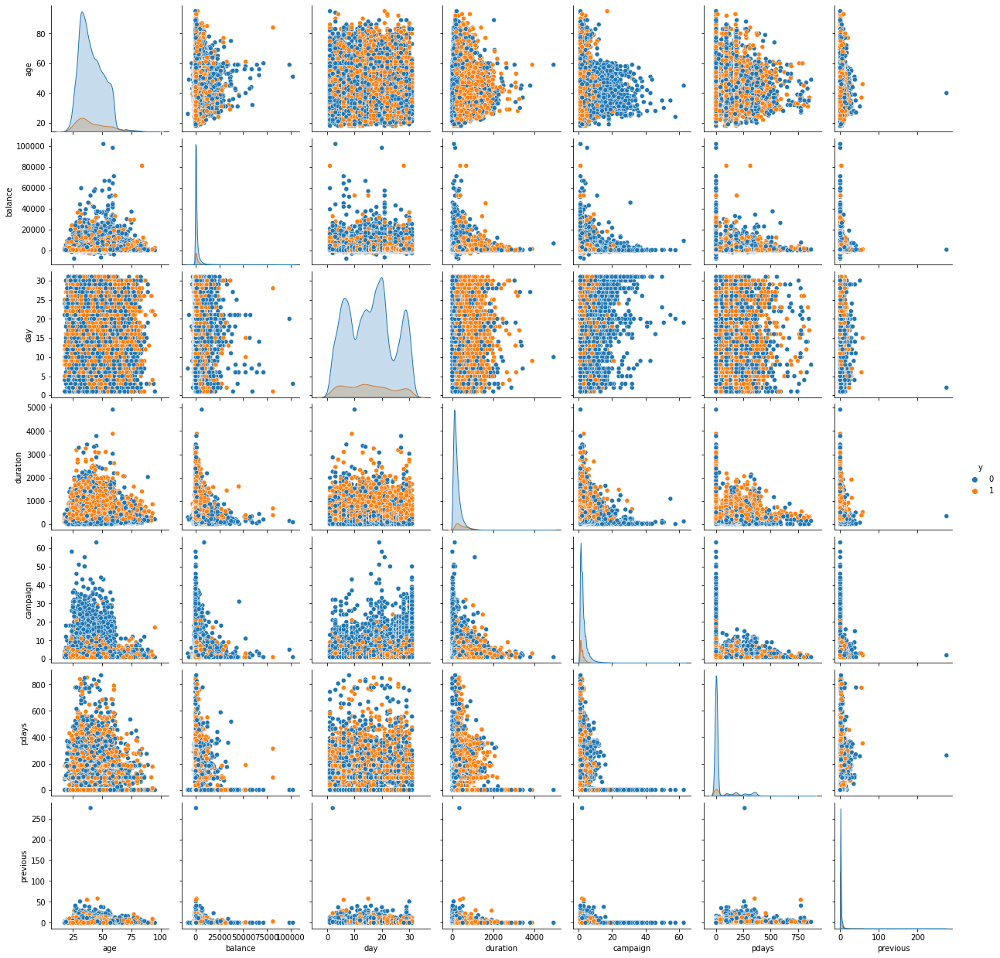

In [ ]:
sns.pairplot(data=df, hue="y");

###Boxplots

In [ ]:
fig4 = make_subplots(rows=2, cols=3,
                   subplot_titles=["Age", "Balance", "Duration", "Day", "pDays", "Campaign", "Previous"])
fig4.add_trace(go.Box(
    y=df["age"],
    name="Age",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=1, col=1)
fig4.add_trace(go.Box(
    y=df["balance"],
    name="Balance",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=1, col=2)
fig4.add_trace(go.Box(
    y=df["duration"],
    name="Duration",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=1, col=3)
fig4.add_trace(go.Box(
    y=df["day"],
    name="Day",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=2, col=1)
fig4.add_trace(go.Box(
    y=df["pdays"],
    name="pDays",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=2, col=2)
fig4.add_trace(go.Box(
    y=df["campaign"],
    name="Campaign",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=2, col=3)
fig4.update_layout(height=750, width=1000, title='Boxplots of Selected Columns', title_x=0.5)

It can be seen that many of the numeric features are right skewed and this resulted also in having many outliers. Hence, exponentional is used to reduce the skewedness.

In [ ]:
lg_tr = FunctionTransformer(np.log1p,validate=True)
lg_tr.fit(df[['pdays']])
df['pdays'] = lg_tr.transform(df[['pdays']])
#lg_tr.fit(df[['balance']])
#df['balance'] = lg_tr.transform(df[['balance']])
lg_tr.fit(df[['duration']])
df['duration'] = lg_tr.transform(df[['duration']])
lg_tr.fit(df[['campaign']])
df['campaign'] = lg_tr.transform(df[['campaign']])
lg_tr.fit(df[['previous']])
df['previous'] = lg_tr.transform(df[['previous']])

<AxesSubplot: >

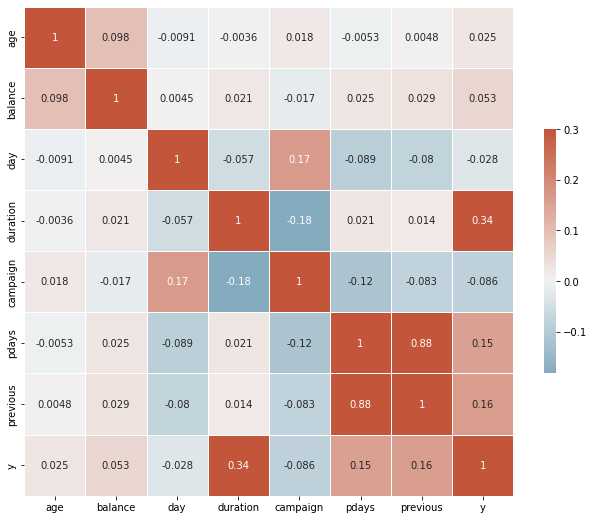

In [ ]:
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df.corr(), annot= True, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

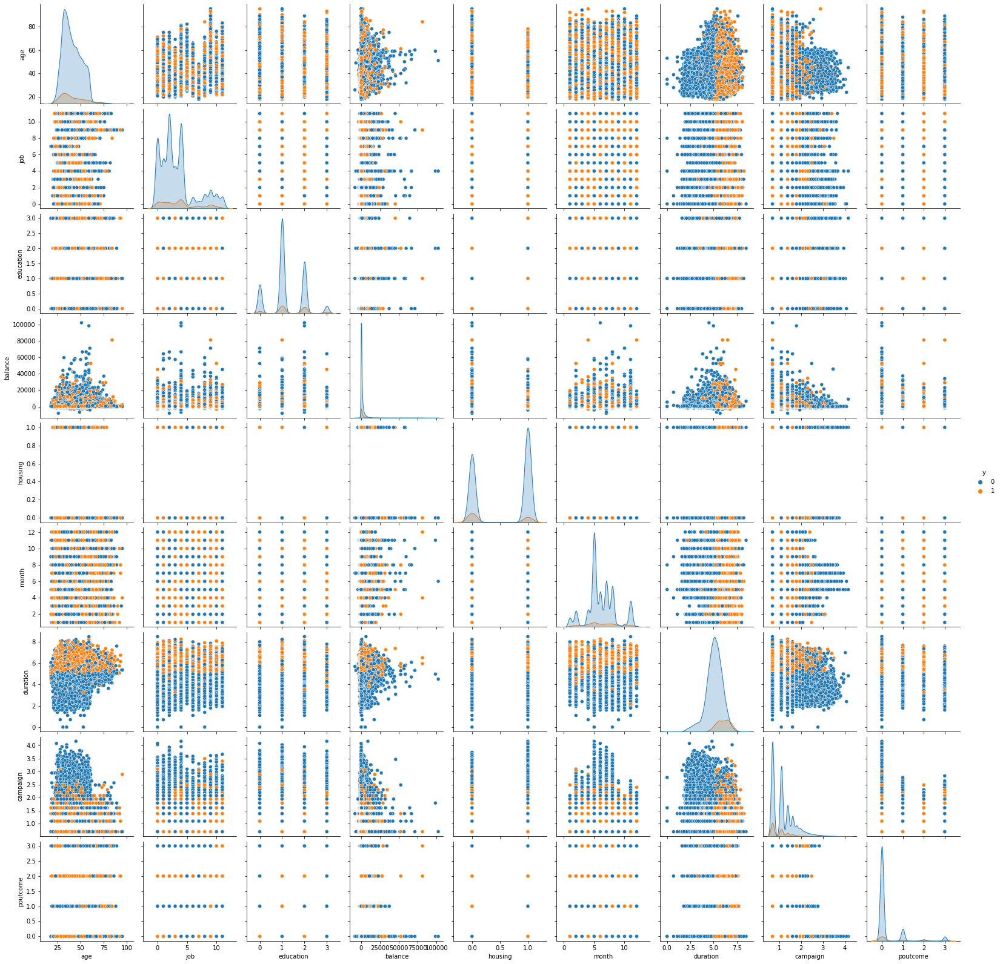

In [ ]:
sns.pairplot(data=df, hue="y");

In [ ]:
fig4 = make_subplots(rows=2, cols=3,
                   subplot_titles=["Age", "Balance", "Duration", "Day", "pDays", "Campaign", "Previous"])
fig4.add_trace(go.Box(
    y=df["age"],
    name="Age",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=1, col=1)
fig4.add_trace(go.Box(
    y=df["balance"],
    name="Balance",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=1, col=2)
fig4.add_trace(go.Box(
    y=df["duration"],
    name="Duration",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=1, col=3)
fig4.add_trace(go.Box(
    y=df["day"],
    name="Day",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=2, col=1)
fig4.add_trace(go.Box(
    y=df["pdays"],
    name="pDays",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=2, col=2)
fig4.add_trace(go.Box(
    y=df["campaign"],
    name="Campaign",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
), row=2, col=3)
fig4.update_layout(height=750, width=1000, title='Boxplots of Selected Columns', title_x=0.5)

In [ ]:
selection = df
selection['job'].replace({'technician':0, 'admin.':1, 'blue-collar':2, 'services':3, 'management':4,
       'unknown':5, 'unemployed':6, 'student':7, 'entrepreneur':8, 'retired':9,
       'self-employed':10, 'housemaid':11}, inplace=True)
selection['housing'].replace({'no':0, 'yes':1}, inplace=True)
selection['contact'].replace({'unknown':0, 'cellular':1,'telephone':2}, inplace=True)
selection['month'].replace({'jan':1,'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6,
                                       'jul':7, 'aug':8, 'sep':9, 'oct':10, 'nov':11, 'dec':12}, inplace=True)
selection['poutcome'].replace({'unknown':0, 'failure':1, 'success':2, 'other':3}, inplace=True)
selection['marital'].replace({'divorced':0, 'married':1, 'single':2}, inplace=True)
selection['education'].replace({'primary':0, 'secondary':1, 'tertiary':2, 'unknown':3}, inplace=True)
selection['pdays']=df['pdays'].replace(-1,0)
 #   bins = [0, 0.5, 1000]
  #  labels = ['not_contacted', 'contacted']
   # df['pdays'] = pd.cut(df['pdays'], bins, labels = labels,include_lowest = True)
    #df['pdays'].replace({'not_contacted':0, 'contacted':1}, inplace=True)
selection['default'].replace({'no':0, 'yes':1}, inplace=True)
selection['loan'].replace({'no':0, 'yes':1}, inplace=True)

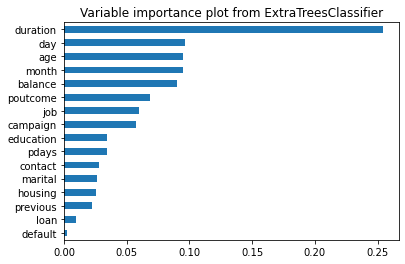

In [ ]:
X = selection.iloc[:,0:16]
y = selection.iloc[:,-1]
etc = ExtraTreesClassifier()
etc.fit(X,y)
importances = etc.feature_importances_
importances = pd.DataFrame({'feature': X.columns, 'importance': importances})
importances = importances.sort_values('importance')
ax = importances.plot(kind='barh', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from ExtraTreesClassifier')
plt.show()

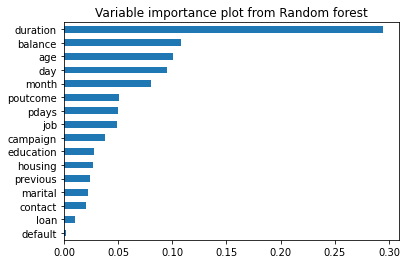

In [ ]:
rfa = RandomForestClassifier()
rfa.fit(X, y)
importances = rfa.feature_importances_

importances = pd.DataFrame({'feature': X.columns, 'importance': importances})
importances = importances.sort_values('importance')


ax = importances.plot(kind='barh', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

In [ ]:
selection1 = selection.drop(['balance'] , axis = 'columns')
X = selection1.iloc[:,0:15] 
y = selection1.iloc[:,-1] 
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

       Specs         Score
10  duration  1.807711e+06
12     pdays  1.171871e+05
13  previous  3.593220e+03
14  poutcome  2.661225e+03
11  campaign  8.405821e+02
1        job  3.921408e+02
5    housing  3.889497e+02
7    contact  3.001611e+02
6       loan  1.765161e+02
8        day  1.592004e+02


From the above the analysis the following features will be dropped

In [ ]:
df = df.drop(['marital', 'default', 'loan', 'contact', 'day', 'pdays', 'previous'], axis = 'columns') 
df

,age,job,education,balance,housing,month,duration,campaign,poutcome,y
0,58,4,2,2143,1,5,261,1,0,0
1,44,0,1,29,1,5,151,1,0,0
2,33,8,1,2,1,5,76,1,0,0
3,47,2,3,1506,1,5,92,1,0,0
4,33,5,3,1,0,5,198,1,0,0
...,...,...,...,...,...,...,...,...,...,...
45206,51,0,2,825,0,11,977,3,0,1
45207,71,9,0,1729,0,11,456,2,0,1
45208,72,9,1,5715,0,11,1127,5,2,1
45209,57,2,1,668,0,11,508,4,0,0


In [ ]:
"""df['job'].replace({'technician':0, 'admin.':1, 'blue-collar':2, 'services':3, 'management':4,
       'unknown':5, 'unemployed':6, 'student':7, 'entrepreneur':8, 'retired':9,
       'self-employed':10, 'housemaid':11}, inplace=True)
df['housing'].replace({'no':0, 'yes':1}, inplace=True)
df['contact'].replace({'unknown':0, 'cellular':1,'telephone':2}, inplace=True)
df['month'].replace({'jan':1,'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6,
                                       'jul':7, 'aug':8, 'sep':9, 'oct':10, 'nov':11, 'dec':12}, inplace=True)
df['poutcome'].replace({'unknown':0, 'failure':1, 'success':2, 'other':3}, inplace=True)
df['marital'].replace({'divorced':0, 'married':1, 'single':2}, inplace=True)
df['education'].replace({'primary':0, 'secondary':1, 'tertiary':2, 'unknown':3}, inplace=True)
df['pdays']=df['pdays'].replace(-1,0)
 #   bins = [0, 0.5, 1000]
  #  labels = ['not_contacted', 'contacted']
   # df['pdays'] = pd.cut(df['pdays'], bins, labels = labels,include_lowest = True)
    #df['pdays'].replace({'not_contacted':0, 'contacted':1}, inplace=True)
df['default'].replace({'no':0, 'yes':1}, inplace=True)
df['loan'].replace({'no':0, 'yes':1}, inplace=True)"""

###Distribution of outcome variables 1 and 0

In [ ]:
df_temp = df["y"].unique()
df['y'].value_counts()

0    39922
1     5289
Name: y, dtype: int64

### Standardization and adding dummy columns

In [ ]:
from sklearn import preprocessing
X = df.iloc[:,0:9]
y = df.iloc[:,-1]

X_num = X[['age', 'balance', 'duration', 'campaign']]
X_cat = X[['job', 'education', 'housing', 'month', 'poutcome']]
#X_cat = X[['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
 #          'month']]
X_num = (X_num - X_num.mean()) / X_num.std() #standardizing
X_norm = (X_num - X_num.min()) / (X_num.max() - X_num.min()) #normalizing

# X_resample_norm.to_csv('X_resample_norm.csv')
naive = pd.concat([X_num, X_cat, y], axis=1)
#dummies for categorical variables
X_cat = pd.get_dummies(X_cat, columns = ['job', 'education','month','poutcome'],
                       drop_first = True)

#X_cat['default'].replace({'no':0, 'yes':1}, inplace=True)
#X_cat['loan'].replace({'no':0, 'yes':1}, inplace=True)
X_cat['housing'].replace({'no':0, 'yes':1}, inplace=True)

X_scaled1 = pd.concat([X_norm, X_cat], axis=1)
oversample = RandomOverSampler(sampling_strategy=0.5)
X_over, y_over = oversample.fit_resample(X_scaled1, y)
undersample = RandomUnderSampler(sampling_strategy=0.5)
X_under, y_under = undersample.fit_resample(X_scaled1, y)

X_scaled_under = pd.concat([X_under, y_under], axis=1)





## Concatenating and Exporting Dataframes

In [ ]:
X_scaled = pd.concat([X_num, X_cat, df["y"]], axis=1) #combine numerical & categorical
X_scaled.to_csv('X_scaled.csv', index=False)
X_scaled

,age,balance,duration,campaign,housing,job_1,job_2,job_3,job_4,job_5,...,month_7,month_8,month_9,month_10,month_11,month_12,poutcome_1,poutcome_2,poutcome_3,y
0,1.606947,0.256416,0.011016,-0.569344,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0.288526,-0.437890,-0.416122,-0.569344,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-0.747376,-0.446758,-0.707353,-0.569344,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.571045,0.047205,-0.645224,-0.569344,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-0.747376,-0.447086,-0.233618,-0.569344,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.947737,-0.176458,2.791298,0.076229,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
45207,2.831195,0.120445,0.768216,-0.246558,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
45208,2.925368,1.429577,3.373760,0.721803,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
45209,1.512774,-0.228021,0.970136,0.399016,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
X_scaled.columns

Index(['age', 'balance', 'duration', 'campaign', 'housing', 'job_1', 'job_2',
       'job_3', 'job_4', 'job_5', 'job_6', 'job_7', 'job_8', 'job_9', 'job_10',
       'job_11', 'education_1', 'education_2', 'education_3', 'month_2',
       'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8',
       'month_9', 'month_10', 'month_11', 'month_12', 'poutcome_1',
       'poutcome_2', 'poutcome_3', 'y'],
      dtype='object')

#Models

##Logistic Regression

###Libraries Used

In [ ]:
#SK-learn

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
x_train,x_test,y_train,y_test=train_test_split(X_scaled1,y,train_size=0.75)
model_L = LogisticRegression(random_state = 5)
model_L.fit(x_train, y_train)
pred4 = model_L.predict(x_test)
print(metrics.classification_report(y_test, pred4))

              precision    recall  f1-score   support

           0       0.92      0.98      0.95      9987
           1       0.66      0.34      0.45      1316

    accuracy                           0.90     11303
   macro avg       0.79      0.66      0.70     11303
weighted avg       0.89      0.90      0.89     11303



###Model Definition

In [ ]:
@dataclass
class LogisticRegression:
    maxIteration: int
    learningRate: float
    epsilon: float
    #filePath: str
    #tolerance: int
        
    #def __post_init__(self):
     #   self.dataReader()
      #  self.X_train = self.addX0(self.X_train)
       # self.X_test = self.addX0(self.X_test)
        
    def addX0(self, X):
        return np.column_stack([np.ones(X.shape[0]), X])
    
    def dataReader(self):
        train_df = pd.read_csv(self.filePath)
        train_df.drop(columns = train_df.columns[0], axis = 1, inplace= True)
        #train_df = pd.read_excel(self.filePath)
        X_train, X_test, y_train, y_test = train_test_split(train_df[train_df.columns[:-1]], train_df[train_df.columns[-1]], test_size=0.3, random_state=1)        
        self.X_train, self.X_test, self.y_train, self.y_test = np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test)
        return
    
    def sigmoid(self, z):
        sig = 1/(1 + np.exp(-z))
        return sig
        
    def predict(self, X):
        sig = self.sigmoid(X.dot(self.w))
        return X.dot(self.w)
    
    def costFunction(self, X, y):
        #pred_ = np.log(np.ones(X.shape[0]) + np.exp(X.dot(self.w))) - X.dot(self.w).dot(y)
        #cost = pred_.sum()

        # log loss
        sig = self.sigmoid(self.predict(X))
        loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
        cost =  -loss.sum() #(1/X.shape[0]) *

        return cost

    def gradient(self, X, y):
        sig = self.sigmoid(X.dot(self.w))
        grad = (sig - y).dot(X) 
        return grad
        
    def gradientDescent(self, X, y):
        cost_sequences = []
        last_cost = float('inf')
        for i in tqdm(range(self.maxIteration)):
            self.w = self.w - self.learningRate * (self.gradient(X, y) + 0.01 * self.w)
            cur_cost = self.costFunction(X, y)
            diff = last_cost - cur_cost
            last_cost = cur_cost
            cost_sequences.append(cur_cost)
            if abs(diff) < self.epsilon:
                print('The model stopped : Converged')
                break
                
        
        return self.plotCost(cost_sequences)
        
    def evaluate(self, y, y_hat):

        accuracy = (y == y_hat).sum()/y.size
        fpr, tpr, _ = metrics.roc_curve(y, y_hat)
        auc = metrics.roc_auc_score(y, y_hat)
        f1 = plt.figure()
        plt.plot(fpr,tpr,label="AUC="+str(auc))
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.legend(loc=4)
        plt.show()
        y = (y == 1)
        y_hat = (y_hat == 1)
        
        precision = (y & y_hat).sum() / y_hat.sum()
        recall = (y & y_hat).sum()/y.sum()
        f_score = 2*(precision * recall)/(precision + recall)
        misclassified = (y != y_hat ).sum()
        return round(accuracy,3), round(precision,3), round(recall,3), round(f_score,3), misclassified
    
    def fit(self, X, y):
        print('Solving using Gradient Descent')
        X = self.addX0(X)
        self.w = np.ones(X.shape[1], dtype = np.float64) * 0
        self.gradientDescent(X, y)
        y_hat = self.sigmoid(self.predict(X))
        y_hat = np.round(y_hat)
        accuracy, precision, recall, f_score, misclassified = self.evaluate(y, y_hat)
        #print('Evaluation for training data : \n')
        #print('Accuracy :', accuracy)
        #print('Precision :', precision)
        #print('Recall :', recall)
        #print('F-Score :',f_score)
        return pd.DataFrame({
        "Accuracy": [accuracy],
        "Precision":[precision],
        "Recall": [recall],
        "f1_score": [f_score],
        "Misclassified": [misclassified]
    })

    def prediction(self, X, y):
        X = self.addX0(X)
        y_hat = self.sigmoid(self.predict(X))
        y_hat = np.round(y_hat)
        accuracy, precision, recall, f_score, misclassified = self.evaluate(y, y_hat)
        #print('Evaluation for testing data : \n')
        #print('Accuracy :', accuracy)
        #print('Precision :', precision)
        #print('Recall :', recall)
        #print('F-Score :',f_score)
        return pd.DataFrame({
        "Accuracy": [accuracy],
        "Precision":[precision],
        "Recall": [recall],
        "f1_score": [f_score],
        "Misclassified": [misclassified]
    })

    def plotCost(self, error_sequences):
        s = np.array(error_sequences)
        t = np.arange(s.size)
        fig, ax = plt.subplots()
        ax.plot(t, s)
        ax.set(xlabel='Iteration', ylabel='Error')
        
    def plot(self):
        plt.figure(figsize=(12, 8))
        ax = plt.axes(projection='3d')

        # Data for three-dimensional scattered points
        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1], 
                     self.sigmoid(self.X_train.dot(self.w)), 
                     c = self.y_train[:], cmap='viridis', s=100);

        ax.set_xlim3d(55, 80)
        ax.set_ylim3d(80, 240)
        plt.xlabel('$x_1$ feature', fontsize=15)
        plt.ylabel('$x_2$ feature', fontsize=15, )
        ax.set_zlabel('$P(Y = 1|x_1, x_2)$', fontsize=15, rotation = 0)   
    
    def scatterPlt(self):
        # evenly sampled points
        x_min, x_max = 55, 80
        y_min, y_max = 80, 240

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)

        f, ax = plt.subplots(figsize=(14,12))

        ax.contour(xx, yy, probs, levels=[0.5], cmap="Greys", vmin=0, vmax=.6)

        ax.scatter(self.X_train[:, 0], self.X_train[:, 1], 
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        plt.xlabel('x1 feature')
        plt.ylabel('x2 feature')
        
    def plot3D(self):
        # evenly sampled points
        x_min, x_max = 55, 80
        y_min, y_max = 80, 240
        
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)
        fig = plt.figure(figsize=(14,12))
        ax = plt.axes(projection='3d')
        ax.contour3D(xx, yy, probs, 50, cmap='binary')

        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1], 
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('probs')
        ax.set_title('3D contour')
        plt.show()

    def getMaxIteration(self):
        return self.maxIteration

    def setMaxIteration(self, maxIteration):
        self.maxIteration = maxIteration
        return

    def getX_train(self):
      return self.X_train

###Model Execution

In [ ]:
lr = LogisticRegression(epsilon = 0.00005,learningRate=0.1, maxIteration=10000)

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [01:22<00:00, 121.78it/s]


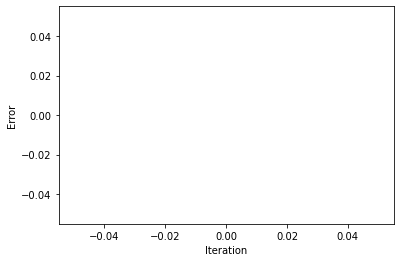

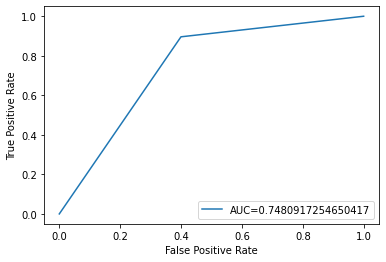

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


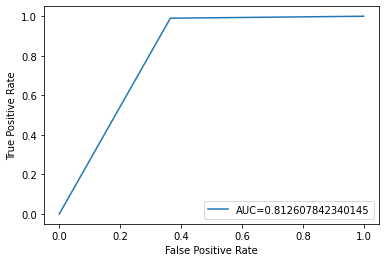

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [00:59<00:00, 168.23it/s]


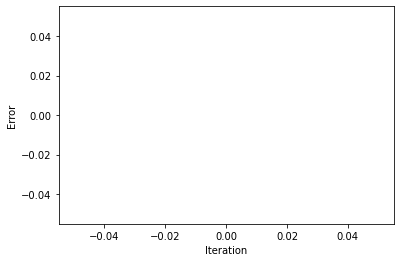

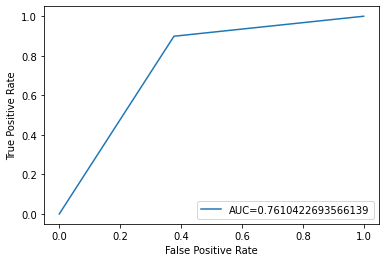

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


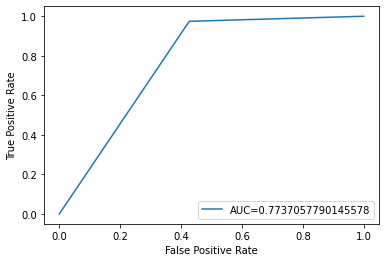

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [01:04<00:00, 154.87it/s]


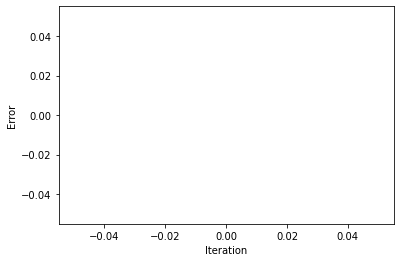

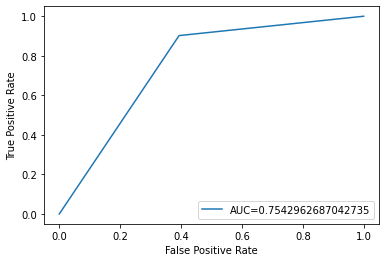

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


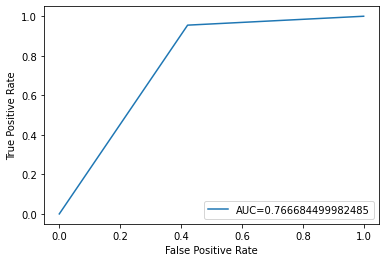

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [01:00<00:00, 164.99it/s]


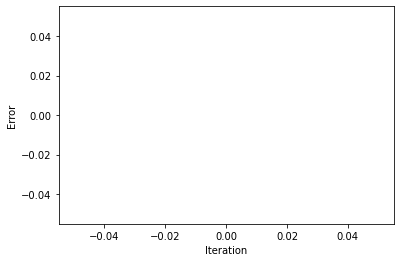

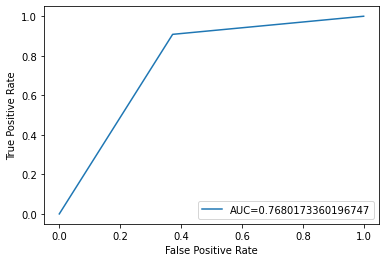

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


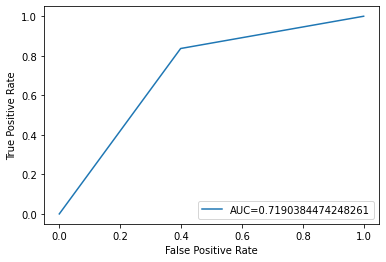

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [01:03<00:00, 157.35it/s]


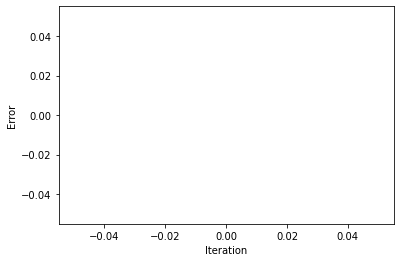

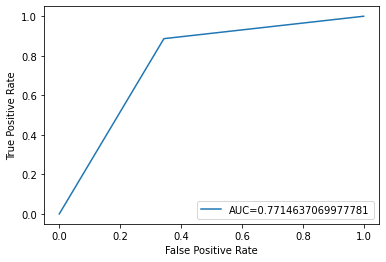

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


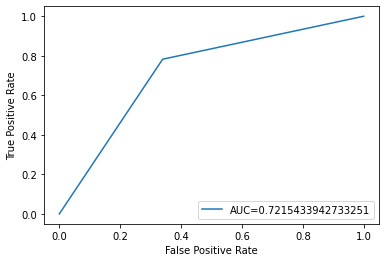

,Accuracy,Precision,Recall,f1_score,Misclassified
Data,,,,,
train,0.7016,0.4882,0.8984,0.6326,6664.8
test,0.6346,0.2140,0.9078,0.3136,3305.4


In [ ]:
results = pd.DataFrame({ })
index = np.array(["train", "test"] * 5)
kf = KFold(n_splits=5)

over_sample = RandomOverSampler(sampling_strategy=0.2)
under_sample = RandomUnderSampler(sampling_strategy=0.4)
X = np.array(X_scaled.iloc[:,0:9])
y = np.array(X_scaled.iloc[:,-1])
for train_index, test_index in kf.split(X):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  X_train, y_train = over_sample.fit_resample(X_train, y_train)
  X_train, y_train = under_sample.fit_resample(X_train, y_train)
  results = results.append(lr.fit(X_train, y_train)) 
  results = results.append(lr.prediction(X_test, y_test))
results.reset_index(drop = True)
results['Data'] = index
#Taking the average of the Kfolds
results.groupby('Data').mean().sort_values("Data", ascending=False)

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [00:55<00:00, 179.68it/s]


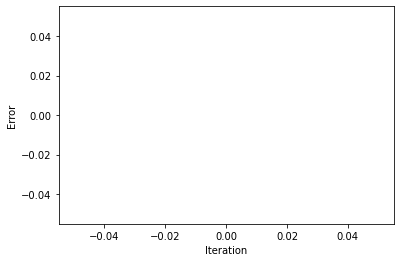

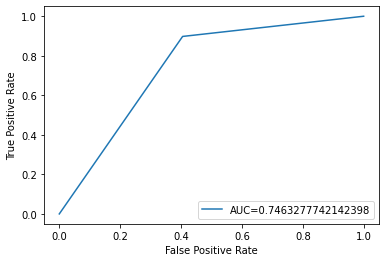

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


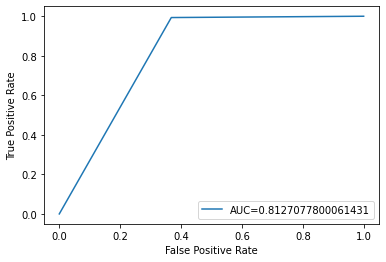

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [00:51<00:00, 192.36it/s]


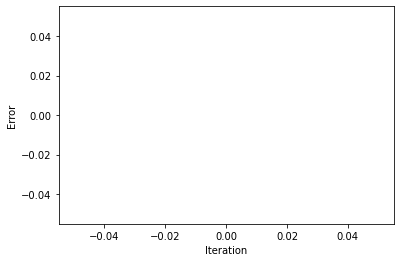

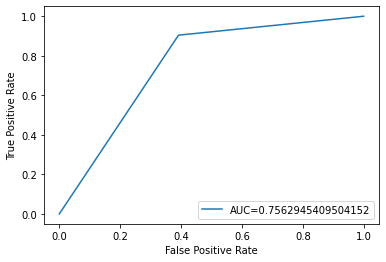

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


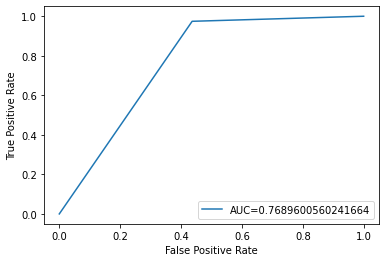

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [00:53<00:00, 188.12it/s]


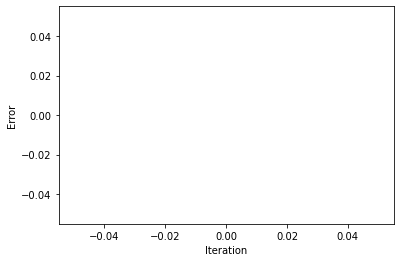

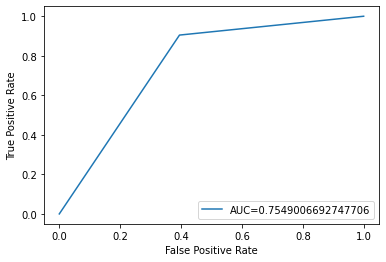

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


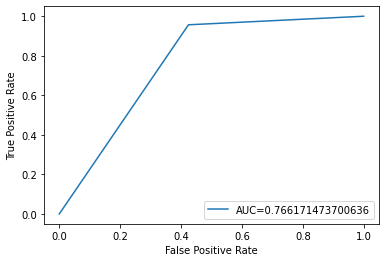

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [00:56<00:00, 177.48it/s]


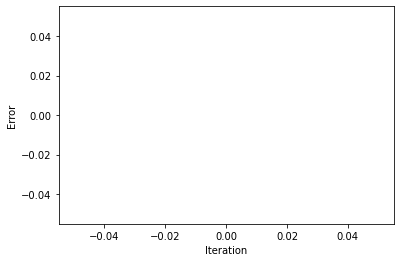

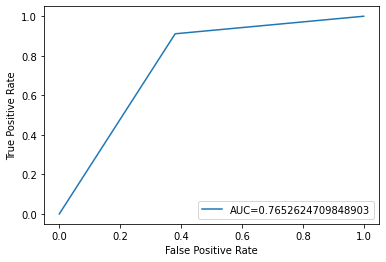

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


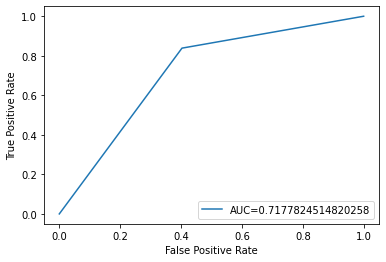

Solving using Gradient Descent


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))
<ipython-input-124-ee05e96152cf>:39: RuntimeWarning: divide by zero encountered in log
  loss = y.dot(np.log(sig)) + (1-y).dot(np.log(1-sig))
100%|██████████| 10000/10000 [00:56<00:00, 176.46it/s]


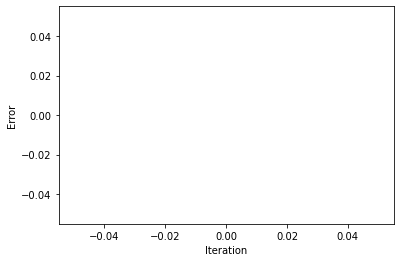

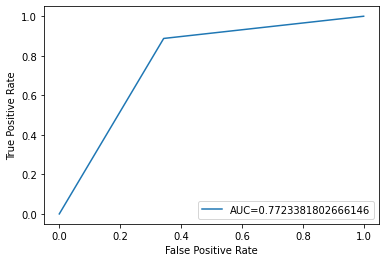

<ipython-input-124-ee05e96152cf>:26: RuntimeWarning: overflow encountered in exp
  sig = 1/(1 + np.exp(-z))


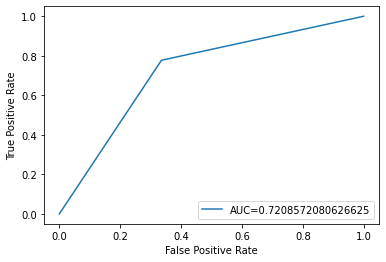

,Accuracy,Precision,Recall,f1_score,Misclassified
Data,,,,,
train,0.6982,0.4852,0.9012,0.6308,6739.6
test,0.6310,0.2132,0.9080,0.3122,3336.2


In [ ]:
lr = LogisticRegression(epsilon = 0.00005, learningRate=1, maxIteration=10000)
results = pd.DataFrame({ })
index = np.array(["train", "test"] * 5)
kf = KFold(n_splits=5)

over_sample = RandomOverSampler(sampling_strategy=0.2)
under_sample = RandomUnderSampler(sampling_strategy=0.4)
X = np.array(X_scaled.iloc[:,0:9])
y = np.array(X_scaled.iloc[:,-1])
for train_index, test_index in kf.split(X):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  X_train, y_train = over_sample.fit_resample(X_train, y_train)
  X_train, y_train = under_sample.fit_resample(X_train, y_train)
  results = results.append(lr.fit(X_train, y_train)) 
  results = results.append(lr.prediction(X_test, y_test))
results.reset_index(drop = True)
results['Data'] = index
#Taking the average of the Kfolds
results.groupby('Data').mean().sort_values("Data", ascending=False)

Solving using Gradient Descent


  2%|▏         | 182/10000 [00:01<01:00, 161.47it/s]


The model stopped : Converged


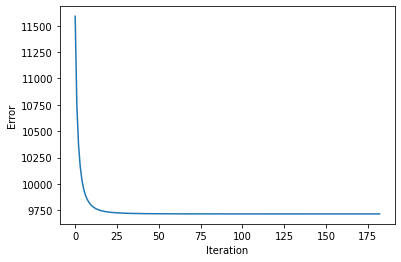

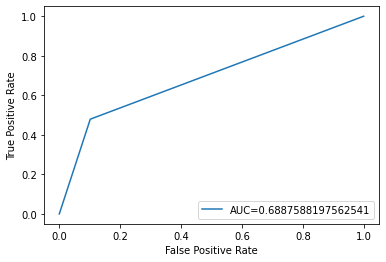

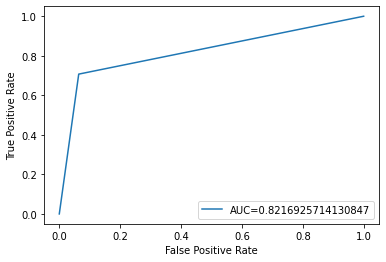

Solving using Gradient Descent


  2%|▏         | 168/10000 [00:01<00:58, 167.92it/s]


The model stopped : Converged


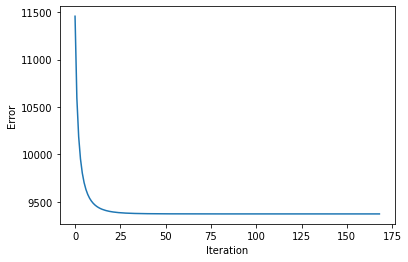

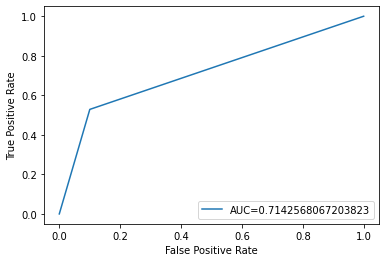

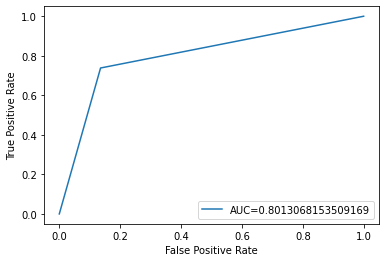

Solving using Gradient Descent


  2%|▏         | 226/10000 [00:01<00:58, 167.49it/s]


The model stopped : Converged


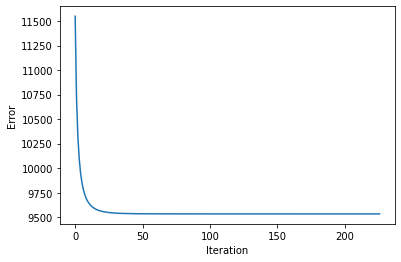

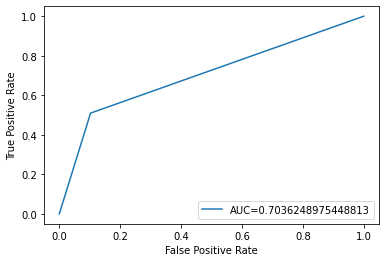

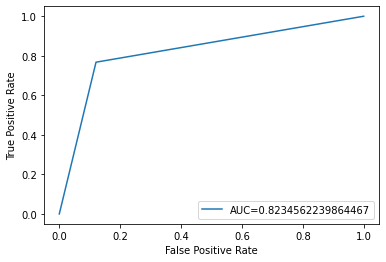

Solving using Gradient Descent


  2%|▏         | 196/10000 [00:01<00:59, 166.10it/s]


The model stopped : Converged


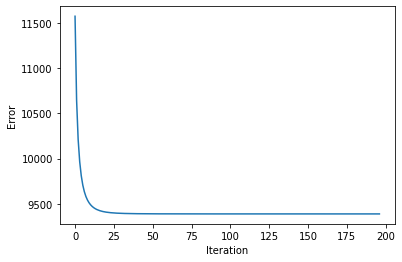

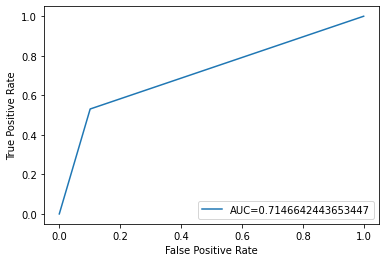

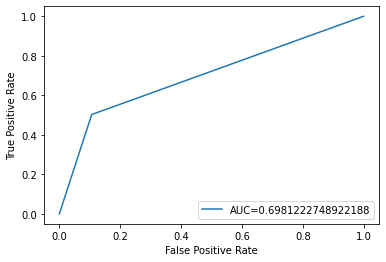

Solving using Gradient Descent


  2%|▏         | 225/10000 [00:01<01:03, 154.81it/s]


The model stopped : Converged


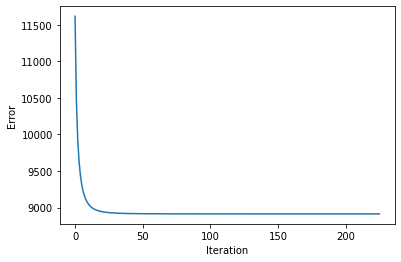

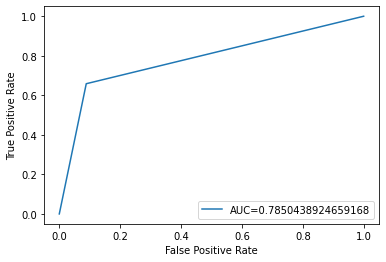

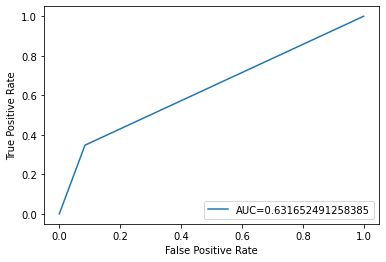

,Accuracy,Precision,Recall,f1_score,Misclassified
Data,,,,,
train,0.7984,0.6842,0.5416,0.6040,4495.0
test,0.8480,0.3718,0.6128,0.4166,1371.0


In [ ]:
lr = LogisticRegression(epsilon = 0.00005,learningRate=0.0001, maxIteration=10000)
results = pd.DataFrame({ })
index = np.array(["train", "test"] * 5)
kf = KFold(n_splits=5)

over_sample = RandomOverSampler(sampling_strategy=0.2)
under_sample = RandomUnderSampler(sampling_strategy=0.4)
X = np.array(X_scaled.iloc[:,0:9])
y = np.array(X_scaled.iloc[:,-1])
for train_index, test_index in kf.split(X):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  X_train, y_train = over_sample.fit_resample(X_train, y_train)
  X_train, y_train = under_sample.fit_resample(X_train, y_train)
  results = results.append(lr.fit(X_train, y_train)) 
  results = results.append(lr.prediction(X_test, y_test))
results.reset_index(drop = True)
results['Data'] = index
#Taking the average of the Kfolds
results.groupby('Data').mean().sort_values("Data", ascending=False)

Solving using Gradient Descent


 14%|█▎        | 1363/10000 [00:08<00:51, 169.06it/s]


The model stopped : Converged


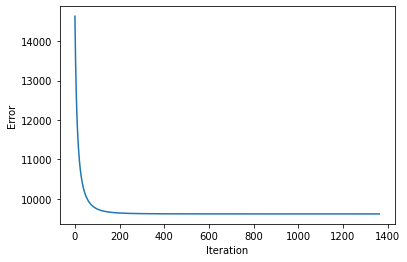

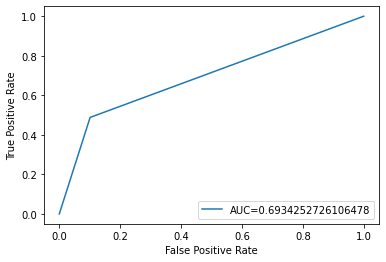

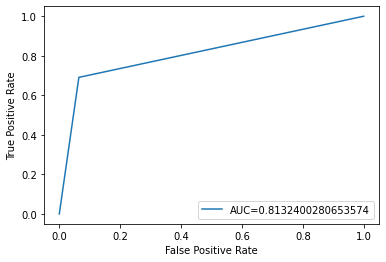

Solving using Gradient Descent


 13%|█▎        | 1341/10000 [00:08<00:51, 167.11it/s]


The model stopped : Converged


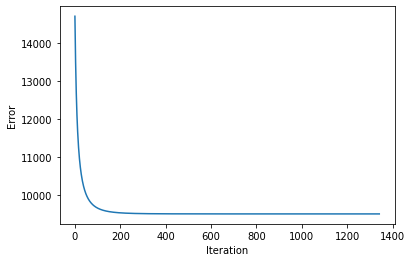

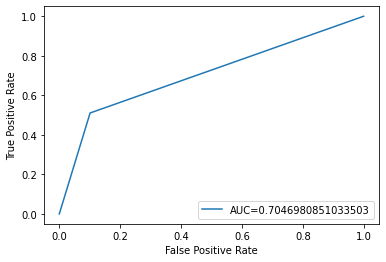

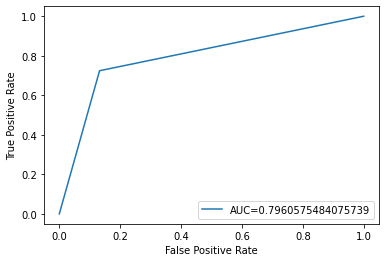

Solving using Gradient Descent


 17%|█▋        | 1718/10000 [00:10<00:50, 163.16it/s]


The model stopped : Converged


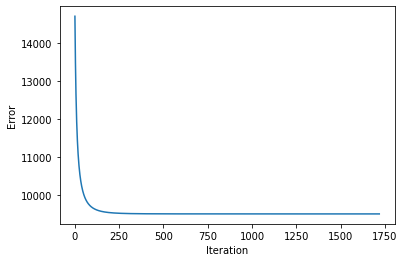

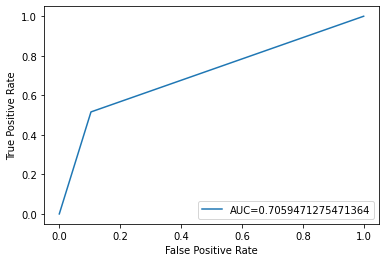

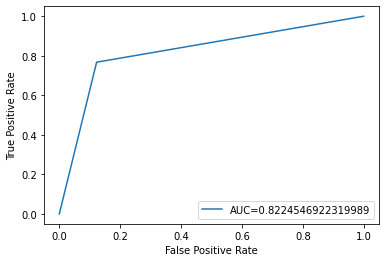

Solving using Gradient Descent


 12%|█▏        | 1181/10000 [00:07<00:53, 164.52it/s]


The model stopped : Converged


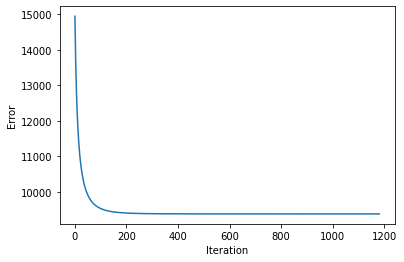

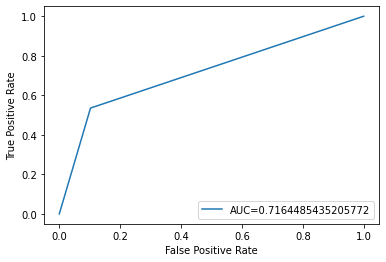

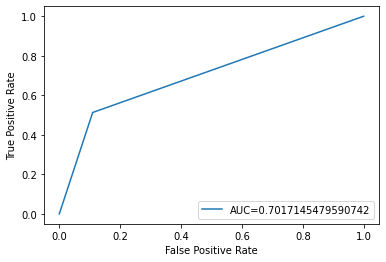

Solving using Gradient Descent


 16%|█▌        | 1579/10000 [00:10<00:54, 154.73it/s]


The model stopped : Converged


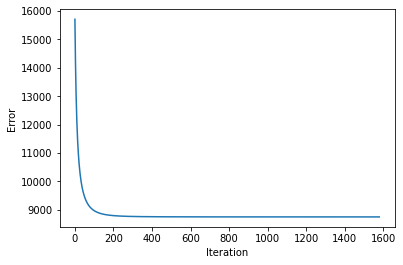

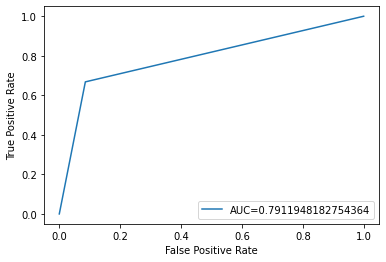

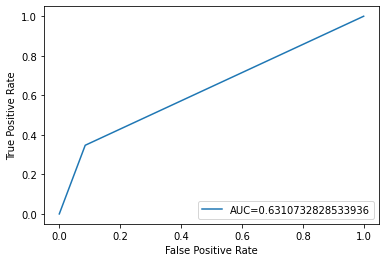

,Accuracy,Precision,Recall,f1_score,Misclassified
Data,,,,,
train,0.7988,0.6850,0.5436,0.6058,4480.0
test,0.8480,0.3692,0.6086,0.4142,1376.0


In [ ]:
lr = LogisticRegression(epsilon = 0.00005,learningRate=0.00001, maxIteration=10000)
results = pd.DataFrame({ })
index = np.array(["train", "test"] * 5)
kf = KFold(n_splits=5)

over_sample = RandomOverSampler(sampling_strategy=0.2)
under_sample = RandomUnderSampler(sampling_strategy=0.4)
X = np.array(X_scaled.iloc[:,0:9])
y = np.array(X_scaled.iloc[:,-1])
for train_index, test_index in kf.split(X):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  X_train, y_train = over_sample.fit_resample(X_train, y_train)
  X_train, y_train = under_sample.fit_resample(X_train, y_train)
  results = results.append(lr.fit(X_train, y_train)) 
  results = results.append(lr.prediction(X_test, y_test))
results.reset_index(drop = True)
results['Data'] = index
#Taking the average of the Kfolds
results.groupby('Data').mean().sort_values("Data", ascending=False)

##Naive Bayes

###Libraries Used

In [ ]:
from dataclasses import dataclass

###Model Definition

In [ ]:
def dataprocessing(df):
    X_train, X_test, y_train, y_test = train_test_split(
        df[df.columns[:-1]], df[df.columns[-1]],test_size=0.2, random_state=0)
    over_sample = RandomOverSampler(sampling_strategy=0.3)
    under_sample = RandomUnderSampler(sampling_strategy=1)
    X_train, y_train = over_sample.fit_resample(X_train, y_train)
    X_train, y_train = under_sample.fit_resample(X_train, y_train)

    return X_train, X_test, y_train, y_test


class NaiveBayes:

    def __init__(self, X, y):
      self.X_train =X
      self.y_train =y

        
    def calprior(self):
        classes = list(self.y_train.unique())
        prior = []
        for i in classes:
          prior.append(len(self.y_train[self.y_train == i])/len(self.y_train))
        return prior

    def likelihood(self, feat_name, feat_val, label):
        df = self.X_train[self.y_train == label]
        if type(feat_val) != str:
          x = self.fitDistribution(df[feat_name])
          x = x.pdf(feat_val)
          return x
        if type(feat_val) == str:
          x = (len(df[df[feat_name]==feat_val])+ 1) / (len(df)+8)
          return x

    def fitDistribution(self, data):
        mean = np.mean(data)
        std = np.std(data)
        dist = norm(mean, std)
        return dist   

    def fit(self):
        features = list(self.X_train.columns)
        prior = self.calprior()
        y_pred = []

        for x, y in zip(np.array(self.X_train), np.array(self.y_train)):
          labels = list(self.y_train.unique())
          likelihood = [1]*len(labels)
          for j in range(len(labels)):
              for i in range(len(features)):
                likelihood[j] *= self.likelihood(features[i], x[i], labels[j])
          
          post_prob = [1]*len(labels)
          for j in range(len(labels)):
            post_prob[j] = (likelihood[j] * prior[j])/(likelihood[j] * prior[j] + likelihood[(1-j)] * prior[(1-j)])
        
          print("P(y=1|%s) = %f"%(x, post_prob[1]))
          print("P(y=0|%s) = %f"%(x, post_prob[0]))
          
          print("the point belongs to class {} and the model\
          predicted {}".format(y, np.argmax(post_prob)))

          y_pred.append(np.argmax(post_prob))

        y_pred = np.array(y_pred) 
        y_train = np.array(self.y_train)
        accuracy, precision, recall, f_score, misclassified = self.evaluate(y_train, y_pred)
        print('f1_score:',f_score)
        print('Accuracy :', accuracy)
        print('Precision :', precision)
        print('Recall :', recall)
        print('Misclassified', misclassified)
        return pd.DataFrame({
        "Accuracy": [accuracy],
        "Precision":[precision],
        "Recall": [recall],
        "f1_score": [f_score],
        "Misclassified": [misclassified]})


    def predict(self, X, y):
        features = list(X.columns)
        y_pred = []
        prior = self.calprior()


        for x, k in zip(np.array(X), np.array(y)):
          labels = list(np.unique(y))
          likelihood = [1]*len(labels)
          for j in range(len(labels)):
              for i in range(len(features)):
                likelihood[j] *= self.likelihood(features[i], x[i], labels[j])
          
          post_prob = [1]*len(labels)
          for j in range(len(labels)):
            post_prob[j] = (likelihood[j] * prior[j])/(likelihood[j] * prior[j] + likelihood[(1-j)] * prior[(1-j)])
        

          y_pred.append(np.argmax(post_prob))


        y_pred = np.array(y_pred) 
        y_test = np.array(y)
        accuracy, precision, recall, f_score, misclassified = self.evaluate(y_test, y_pred)
        print('f1_score:',f_score)
        print('Accuracy :', accuracy)
        print('Precision :', precision)
        print('Recall :', recall)
        print('Misclassified', misclassified)
        return pd.DataFrame({
        "Accuracy": [accuracy],
        "Precision":[precision],
        "Recall": [recall],
        "f1_score": [f_score],
        "Misclassified": [misclassified]})


    def evaluate(self, y, y_hat):

        accuracy = (y == y_hat).sum()/y.size
        fpr, tpr, _ = metrics.roc_curve(y, y_hat)
        auc = metrics.roc_auc_score(y, y_hat)
        f1 = plt.figure()
        plt.plot(fpr,tpr,label="AUC="+str(auc))
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.legend(loc=4)
        plt.show()
        y = (y == 1)
        y_hat = (y_hat == 1)
        precision = (y & y_hat).sum()/y_hat.sum()
        recall = (y & y_hat).sum()/y.sum()
        f_score = 2*(precision * recall)/(precision + recall)
        misclassified = (y != y_hat ).sum()
        return round(accuracy,3), round(precision,3), round(recall,3), round(f_score,3), misclassified \

        nb = NaiveBayes(X_train,y_train)

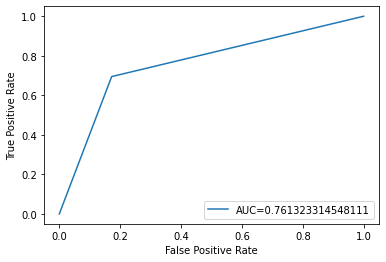

f1_score: 0.744
Accuracy : 0.761
Precision : 0.801
Recall : 0.695
Misclassified 4574


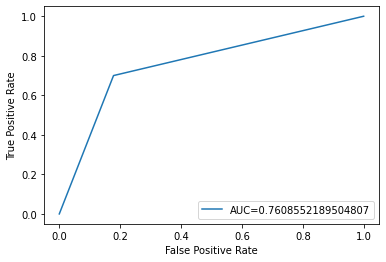

f1_score: 0.461
Accuracy : 0.807
Precision : 0.343
Recall : 0.7
Misclassified 1741


,Accuracy,Precision,Recall,f1_score,Misclassified
0,0.761,0.801,0.695,0.744,4574
0,0.807,0.343,0.700,0.461,1741


In [ ]:
X_train, X_test, y_train, y_test = dataprocessing(naive)
nb = NaiveBayes(X_train,y_train)


results = results.append(nb.fit())
results = results.append(nb.predict(X_test, y_test))
results

In [ ]:
nb = NaiveBayes()
results = pd.DataFrame({ })
index = np.array(["train", "test"])
kf = KFold(n_splits=2)

#over_sample = RandomOverSampler(sampling_strategy=0.21)
under_sample = RandomUnderSampler(sampling_strategy=1)
X = np.array(naive.iloc[:,0:9])
y = np.array(naive.iloc[:,-1])
for train_index, test_index in kf.split(X):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  #X_train, y_train = over_sample.fit_resample(X_train, y_train)
  X_train, y_train = under_sample.fit_resample(X_train, y_train)
  X_test, y_test = under_sample.fit_resample(X_test, y_test)
  X_train = pd.DataFrame(X_train, columns=['age', 'job', 'education', 'balance', 'housing', 'month', 'duration',
       'campaign', 'poutcome'])
  X_test = pd.DataFrame(X_test, columns=['age', 'job', 'education', 'balance', 'housing', 'month', 'duration',
       'campaign', 'poutcome'])
  y_train = pd.DataFrame(y_train, columns=['y'])
  y_test = pd.DataFrame(y_test, columns=['y'])
  results = results.append(nb.fit(X_train, y_train))
  results = results.append(nb.predict(X_test, y_test))
results.reset_index(drop = True)
results['Data'] = index
results.groupby('Data').mean().sort_values("Data", ascending=False)

###Model Execution

In [ ]:
nb = NaiveBayes(filePath ="/content/bank-full.csv")

TypeError: ignored

In [ ]:
results

,Accuracy,Precision,Recall,f1_score,Misclassified
0,4201.0,4201.0,4104.0,4151.934,35296802
0,1088.0,1088.0,1049.0,1068.144,2367488
0,1088.0,1088.0,1188.0,1135.803,2367488
0,4201.0,4201.0,2284.0,2959.162,35296802


In [ ]:
naive

,age,balance,duration,campaign,job,education,housing,month,poutcome,y
0,1.606947,0.256416,0.430162,-0.909447,management,tertiary,yes,may,unknown,0
1,0.288526,-0.437890,-0.160477,-0.909447,technician,secondary,yes,may,unknown,0
2,-0.747376,-0.446758,-0.898228,-0.909447,entrepreneur,secondary,yes,may,unknown,0
3,0.571045,0.047205,-0.693423,-0.909447,blue-collar,unknown,yes,may,unknown,0
4,-0.747376,-0.447086,0.131797,-0.909447,unknown,unknown,no,may,unknown,0
...,...,...,...,...,...,...,...,...,...,...
45206,0.947737,-0.176458,1.859034,0.444997,technician,tertiary,no,nov,unknown,1
45207,2.831195,0.120445,1.033683,-0.117148,retired,primary,no,nov,unknown,1
45208,2.925368,1.429577,2.013827,1.237296,retired,secondary,no,nov,success,1
45209,1.512774,-0.228021,1.150587,0.881030,blue-collar,secondary,no,nov,unknown,0


In [ ]:
na = naive
w = np.array(na.iloc[:,0:9])
e = np.array(na.iloc[:,-1])
#w , e = under_sample.fit_resample(w, e)

In [ ]:
w

array([[1.6069471864824068, 0.25641641627596995, 0.4301620742705413, ...,
        'yes', 'may', 'unknown'],
       [0.28852607995632196, -0.437889851794998, -0.1604770147311737,
        ..., 'yes', 'may', 'unknown'],
       [-0.7473762180284589, -0.4467575288233406, -0.8982281783092013,
        ..., 'yes', 'may', 'unknown'],
       ...,
       [2.9253682930084914, 1.429577243877435, 2.013827097595003, ...,
        'no', 'nov', 'success'],
       [1.512774250301972, -0.22802149545755784, 1.1505871273601431, ...,
        'no', 'nov', 'unknown'],
       [-0.3706844733067204, 0.5283585118118079, 0.7808803054812798, ...,
        'no', 'nov', 'other']], dtype=object)

In [ ]:
nb = NaiveBayes()
results = pd.DataFrame({ })
index = np.array(["train", "test"] * 5)
kf = KFold(n_splits=2)

#over_sample = RandomOverSampler(sampling_strategy=0.21)
under_sample = RandomUnderSampler(sampling_strategy=1)
X = np.array(naive.iloc[:,0:9])
y = np.array(naive.iloc[:,-1])
for train_index, test_index in kf.split(X):
  X_train, X_test = w[train_index], w[test_index]
  y_train, y_test = e[train_index], e[test_index]
  #X_train, y_train = over_sample.fit_resample(X_train, y_train)
  X_train, y_train = under_sample.fit_resample(X_train, y_train)
  X_test, y_test = under_sample.fit_resample(X_test, y_test)
  X_train = pd.DataFrame(X_train, columns=['age', 'job', 'education', 'balance', 'housing', 'month', 'duration',
       'campaign', 'poutcome'])
  X_test = pd.DataFrame(X_test, columns=['age', 'job', 'education', 'balance', 'housing', 'month', 'duration',
       'campaign', 'poutcome'])
  y_train = pd.DataFrame(y_train, columns=['y'])
  y_test = pd.DataFrame(y_test, columns=['y'])
  results = results.append(nb.fit(X_train, y_train))
  results = results.append(nb.predict(X_test, y_test))
results.reset_index(drop = True)
results['Data'] = index
results.groupby('Data').mean().sort_values("Data", ascending=False)

IndexError: ignored

#NEURAL NETWORKS

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.93      0.97      0.95      9972
           1       0.64      0.42      0.51      1331

    accuracy                           0.90     11303
   macro avg       0.79      0.70      0.73     11303
weighted avg       0.89      0.90      0.90     11303



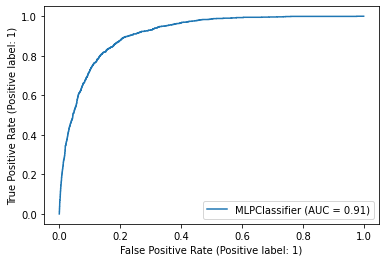

In [ ]:
#original-normalized- learning rate = 0.001
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_scaled1,y,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.001) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.93      0.96      0.95     10074
           1       0.56      0.42      0.48      1229

    accuracy                           0.90     11303
   macro avg       0.75      0.69      0.71     11303
weighted avg       0.89      0.90      0.89     11303



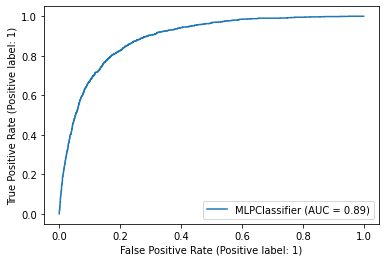

In [ ]:
#original-normalized- learning rate = 0.01
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_scaled1,y,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.01) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.87      0.88      0.87      2681
           1       0.74      0.72      0.73      1286

    accuracy                           0.83      3967
   macro avg       0.81      0.80      0.80      3967
weighted avg       0.83      0.83      0.83      3967



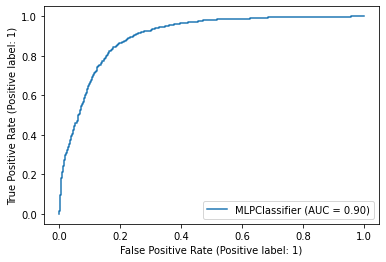

In [ ]:
#undersampled-normalized- learning rate = 0.001
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_under,y_under,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.001) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.87      0.87      0.87      2641
           1       0.74      0.74      0.74      1326

    accuracy                           0.83      3967
   macro avg       0.80      0.81      0.80      3967
weighted avg       0.83      0.83      0.83      3967



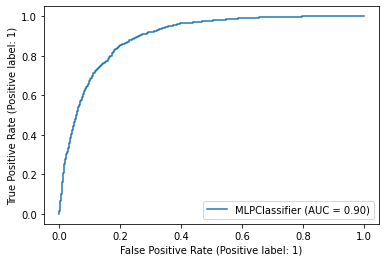

In [ ]:
#undersampled-normalized- learning rate = 0.01
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_under,y_under,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.01) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

              precision    recall  f1-score   support

           0       0.85      0.86      0.86      2645
           1       0.71      0.71      0.71      1322

    accuracy                           0.81      3967
   macro avg       0.78      0.78      0.78      3967
weighted avg       0.81      0.81      0.81      3967



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


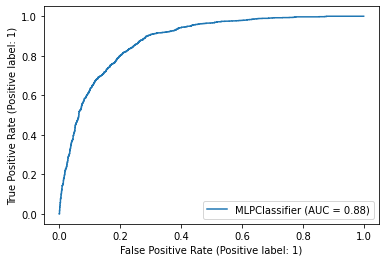

In [ ]:
#undersampled-normalized- learning rate = 0.1
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_under,y_under,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.1) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.88      0.90      0.89      9952
           1       0.78      0.75      0.77      5019

    accuracy                           0.85     14971
   macro avg       0.83      0.82      0.83     14971
weighted avg       0.85      0.85      0.85     14971



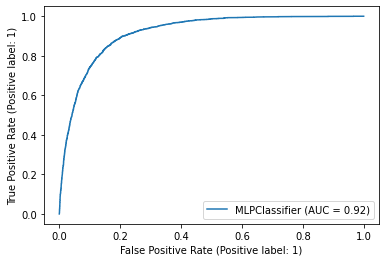

In [ ]:
#oversampled-normalized- learning rate = 0.001
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_over,y_over,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.001) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.89      0.90      0.90      9954
           1       0.80      0.78      0.79      5017

    accuracy                           0.86     14971
   macro avg       0.84      0.84      0.84     14971
weighted avg       0.86      0.86      0.86     14971



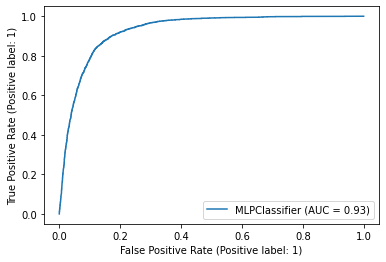

In [ ]:
#oversampled-normalized- learning rate = 0.01
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_over,y_over,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.01) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

              precision    recall  f1-score   support

           0       0.90      0.86      0.88      9984
           1       0.74      0.82      0.78      4987

    accuracy                           0.85     14971
   macro avg       0.82      0.84      0.83     14971
weighted avg       0.85      0.85      0.85     14971



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


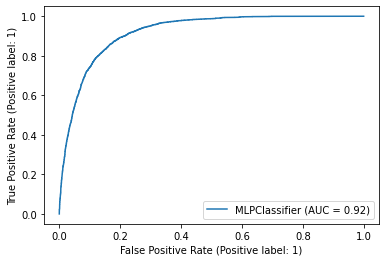

In [ ]:
#oversampled-normalized- learning rate = 0.1
from sklearn.neural_network import MLPClassifier
x_train,x_test,y_train,y_test = train_test_split(X_over,y_over,train_size=0.75)
nn = MLPClassifier(random_state = 1, activation= 'logistic', learning_rate_init=0.1) 
nn.fit(x_train, y_train)
pred5 = nn.predict(x_test)
print(metrics.classification_report(y_test, pred5))
print(metrics.plot_roc_curve(nn, x_test, y_test))

In [ ]:
#SVM

class KernelSvmClassifier:
    
    def __init__(self, C, kernel):#initialized a function here->GRBF
        self.C = C                               
        self.kernel = kernel          # <---
        self.alpha = None
        self.supportVectors = None
    
    def fit(self, X, y):
        N = len(y)
        # --->
        # Gram matrix of h(x) y
        hXX = np.apply_along_axis(lambda x1 : np.apply_along_axis(lambda x2:  self.kernel(x1, x2), 1, X),
                                 1, X)  
        
        
        print("1")
        yp = y.reshape(-1, 1)
        GramHXy = hXX * np.matmul(yp, yp.T) 
        # <---
        print("2")
        # Lagrange dual problem
        def Ld0(G, alpha):
            return alpha.sum() - 0.5 * alpha.dot(alpha.dot(G))
        print("3")
        # Partial derivate of Ld on alpha
        def Ld0dAlpha(G, alpha):
            return np.ones_like(alpha) - alpha.dot(G)
        print("4")
        # Constraints on alpha of the shape :
        # -  d - C*alpha  = 0
        # -  b - A*alpha >= 0
        A = np.vstack((-np.eye(N), np.eye(N)))             # <---
        b = np.hstack((np.zeros(N), self.C * np.ones(N)))  # <---
        constraints = ({'type': 'eq',   'fun': lambda a: np.dot(a, y),     'jac': lambda a: y},
                       {'type': 'ineq', 'fun': lambda a: b - np.dot(A, a), 'jac': lambda a: -A})
        print("5")
        # Maximize by minimizing the opposite
        optRes = optimize.minimize(fun=lambda a: -Ld0(GramHXy, a),
                                   x0=np.ones(N), 
                                   method='SLSQP', 
                                   jac=lambda a: -Ld0dAlpha(GramHXy, a), 
                                   constraints=constraints)
        self.alpha = optRes.x
        print("6")
        # --->
        epsilon = 1e-8
        supportIndices = self.alpha > epsilon
        self.supportVectors = X[supportIndices]
        self.supportAlphaY = y[supportIndices] * self.alpha[supportIndices]
        print("7")
        # <---
    
    def predict(self, X):
        """ Predict y values in {-1, 1} """
        # --->
        def predict1(x):
            x1 = np.apply_along_axis(lambda s: self.kernel(s, x), 1, self.supportVectors)
            x2 = x1 * self.supportAlphaY
            return np.sum(x2)
        
        d = np.apply_along_axis(predict1, 1, X)
        return 2 * (d > 0) - 1
        # <---

In [ ]:
X_scaled_under['y']=X_scaled_under['y'].map({1:1,0:-1})
X_svm=X_scaled_under.copy()
X_svm.head()



,age,balance,duration,campaign,housing,job_1,job_2,job_3,job_4,job_5,...,month_7,month_8,month_9,month_10,month_11,month_12,poutcome_1,poutcome_2,poutcome_3,y
0,0.350649,0.073058,0.043717,0.000000,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,-1
1,0.350649,0.098533,0.022773,0.000000,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,-1
2,0.545455,0.105369,0.027044,0.016129,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
3,0.389610,0.072803,0.022163,0.048387,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,-1
4,0.077922,0.072803,0.016877,0.032258,1,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,-1


In [ ]:
#Drop 'y' column and split the dataset
X = X_svm.drop(['y'], axis = 'columns')
y = X_svm.y
train, test, ytrain, ytest = train_test_split(X, y, test_size= 0.8)

In [ ]:
#RBF Kernel function,will be called for each data point
def GRBF(x1, x2):
    diff = x1 - x2
    return np.exp(-np.dot(diff, diff) * len(x1) / 2)

In [ ]:
SVM_RGB = KernelSvmClassifier(C=70, kernel=GRBF)#we can call different kernels for different instances of the class

In [ ]:
from scipy import optimize

In [ ]:
SVM_RGB.fit(np.array(train), np.array(ytrain))

1
2
3
4
5


In [ ]:
SVM_RGB.supportVectors

In [ ]:
predicted=SVM_RGB.predict(test)
print(predicted)

In [ ]:
print(ytest)

In [ ]:
#Getting perfomance metrics,accuracy

metrics.accuracy_score(ytest,pd.DataFrame(data=predicted))

In [ ]:

metrics.precision_score(ytest,pd.DataFrame(data=predicted))

In [ ]:
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=metrics.confusion_matrix(ytest,pd.DataFrame(data=predicted)))
disp.plot()
plt.show()

In [ ]:

metrics.recall_score(ytest,pd.DataFrame(data=predicted))